# this notebook plots markers on umap and as barplots in the wt and mutant samples as requested by reviewers

In [46]:
import scanpy as sc
import pandas as pd
import numpy as np
import harmonypy as ho
import sys

In [47]:
sys.path.append( "/home/lucy/")

In [48]:
import zc_function as zc

In [49]:
sc.set_figure_params( figsize=[4,4] )

In [50]:
import seaborn as sn
from matplotlib import pyplot as plt

## load data

In [51]:
dat = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [52]:
wt = sc.read("./new_sample_10868_filtered/subsampled_wt_epi.h5ad")
mut = sc.read("./new_sample_10868_filtered/old_subsampled_epi/subsampled_mut_epi.h5ad")

In [8]:
wt

AnnData object with n_obs × n_vars = 6365 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'leiden_dge', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [7]:
# wt_umap2 = pd.read_csv("./batch_effect_correction/wt_hm_umap_refilter.csv", header = None, index_col = 0)
# wt_umap2.head()

In [24]:
#wt_umap2.shape

(6365, 2)

In [25]:
#wt.obsm['X_umap'] = wt_umap2.values

In [8]:
wt.n_obs + mut.n_obs

12792

In [10]:
#dat.n_obs

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


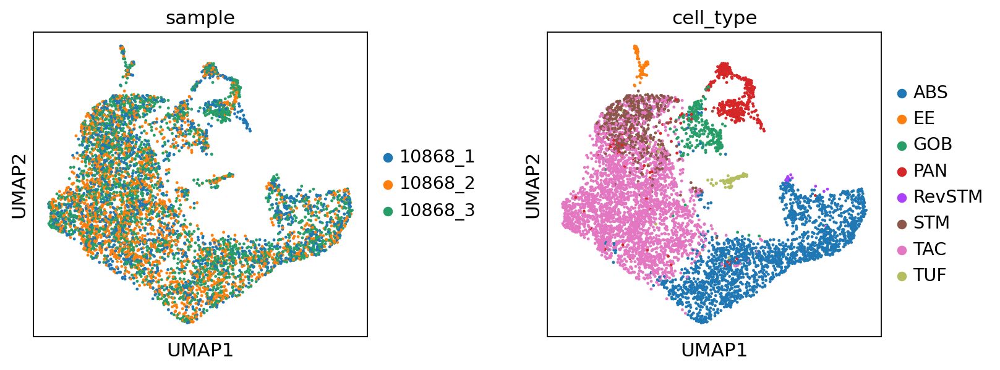

In [9]:
sc.pl.umap( wt, color = ['sample', 'cell_type'] , wspace = 0.4)

In [12]:
#sc.tl.umap( wt, min_dist= 0.4, spread = 1.2, random_state= 5)

/home/lucy/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


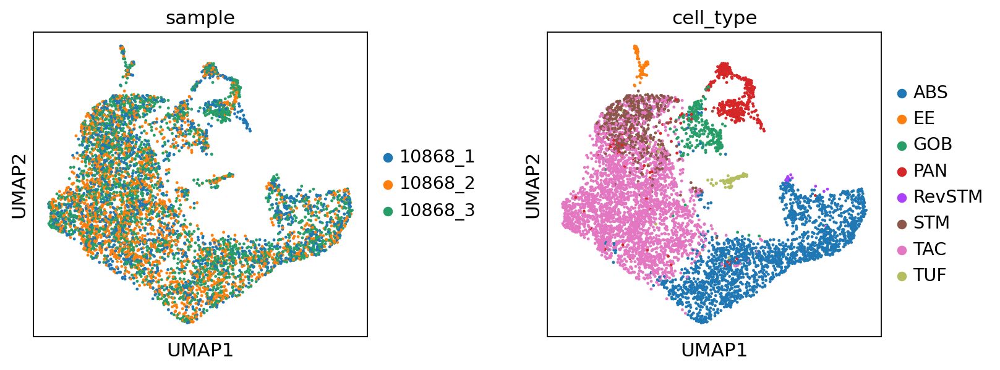

In [13]:
sc.pl.umap( wt, color = ['sample', 'cell_type'] , wspace = 0.4)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


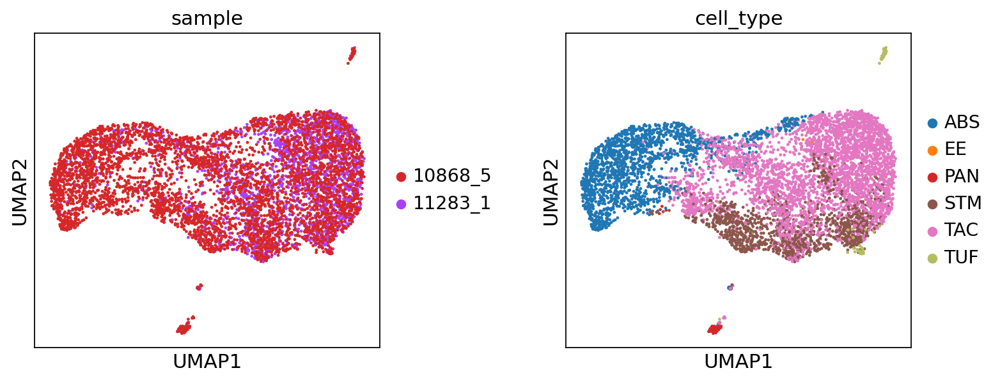

In [20]:
sc.pl.umap( mut, color = ['sample', 'cell_type'] , wspace = 0.4)

## marker gene expression

In [28]:
stem_markers = pd.Series( ['Lgr5', 'Myc', 'Ascl2', 'Olfm4', 'Clu', 'Hopx', 'Tert', 'Bmi1' ] )

In [11]:
#stem_markers[~ np.isin( stem_markers, dat.var_names ) ] # all found

In [12]:
wt.raw = wt.copy()
mut.raw = mut.copy()

In [13]:
ret = zc.normalization( wt)
ret = zc.normalization( mut)

In [14]:
sc.set_figure_params( figsize=[4,4])

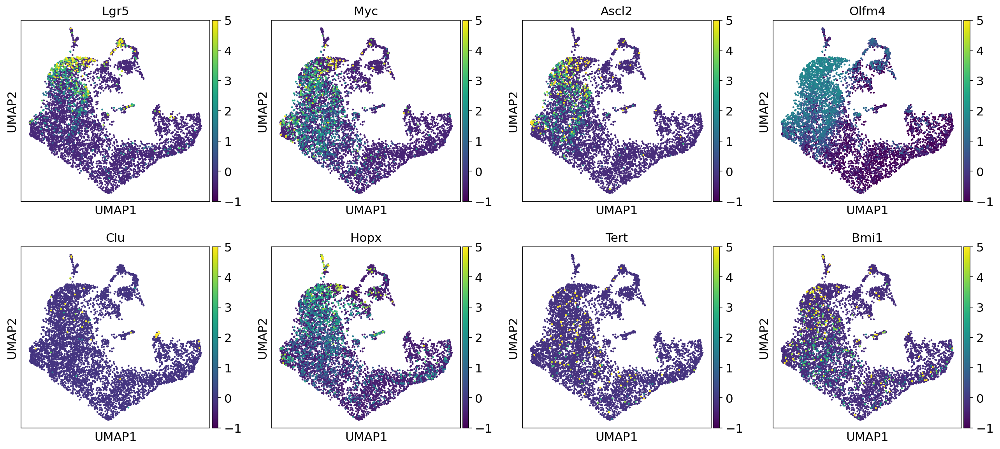

In [26]:
sc.pl.umap( wt, color = list( stem_markers ) , use_raw = False, vmin = -1, vmax = 5 )

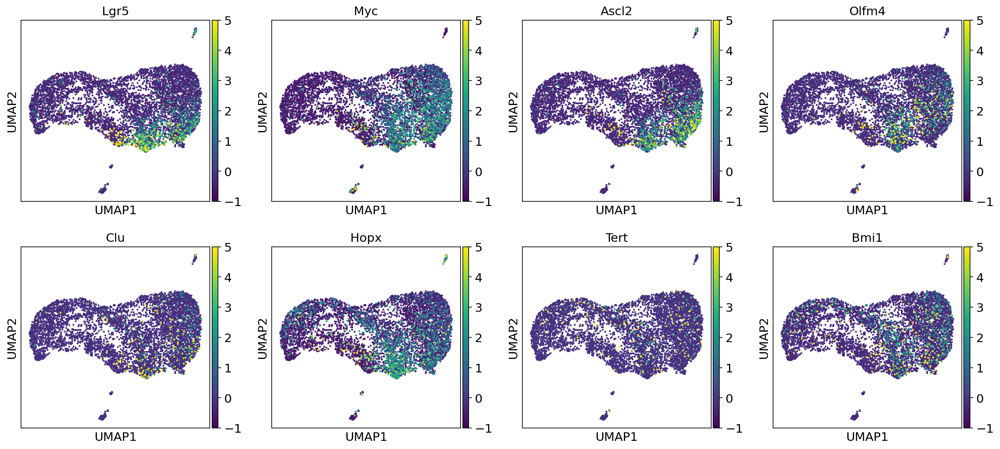

In [27]:
sc.pl.umap( mut, color = list( stem_markers ) , use_raw = False,  vmin = -1, vmax = 5 )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


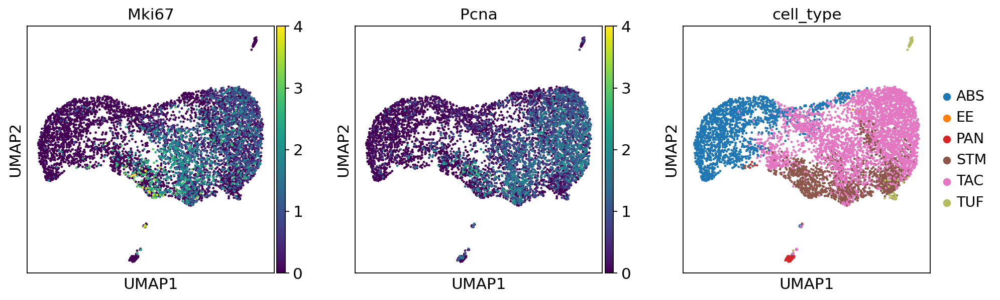

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


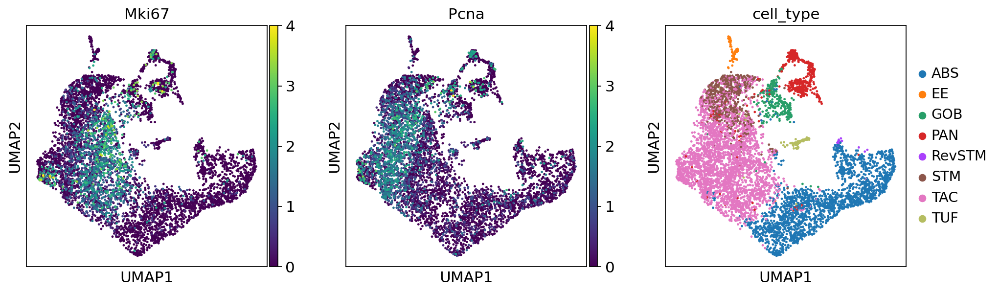

In [28]:
sc.pl.umap( mut, color = ['Mki67','Pcna'] + ['cell_type'] , use_raw = False ,  vmin = 0, vmax = 4)
sc.pl.umap( wt, color = ['Mki67','Pcna'] + ['cell_type'] , use_raw = False, vmin = 0, vmax = 4 )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


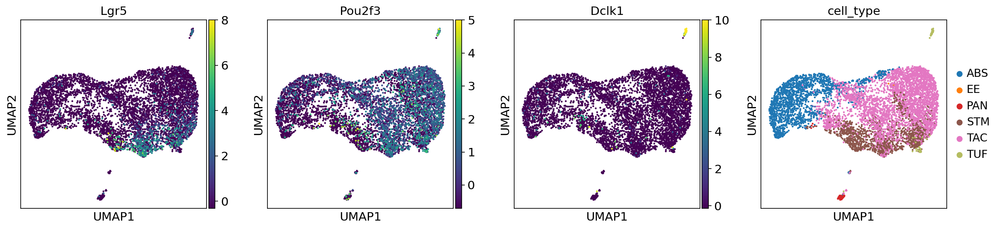

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


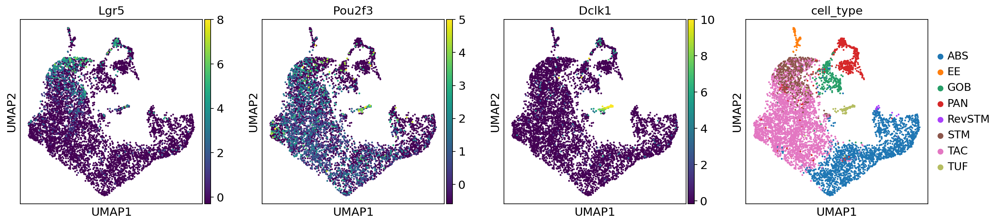

In [29]:
sc.pl.umap( mut, color = ['Lgr5','Pou2f3', 'Dclk1'] + ['cell_type'] , use_raw = False, vmax = [8,5,10] )
sc.pl.umap( wt, color = ['Lgr5','Pou2f3', 'Dclk1'] + ['cell_type'] , use_raw = False, vmax = [8,5,10] )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


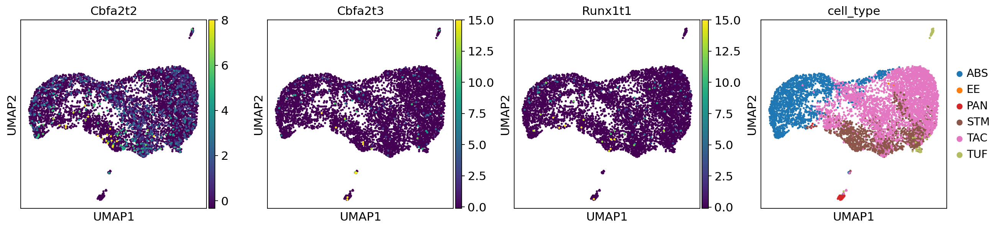

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


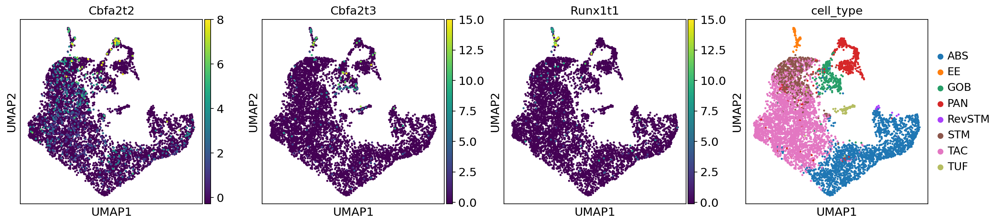

In [30]:
sc.pl.umap( mut, color = ['Cbfa2t2','Cbfa2t3', 'Runx1t1'] + ['cell_type'] , use_raw = False , vmax = [8,15,15] , s= 25)
sc.pl.umap( wt, color = ['Cbfa2t2','Cbfa2t3', 'Runx1t1'] + ['cell_type'] , use_raw = False , vmax = [8,15,15],   s =25)

### plot only with arcsinh transformed X

In [15]:
wt.X.sum(axis = 1)

array([ 888.3561  ,  -13.333248,  104.282166, ..., -423.28467 ,
       -702.49664 ,  418.04868 ], dtype=float32)

In [16]:
wt.X = wt.layers['arcsinh']
mut.X = mut.layers['arcsinh']

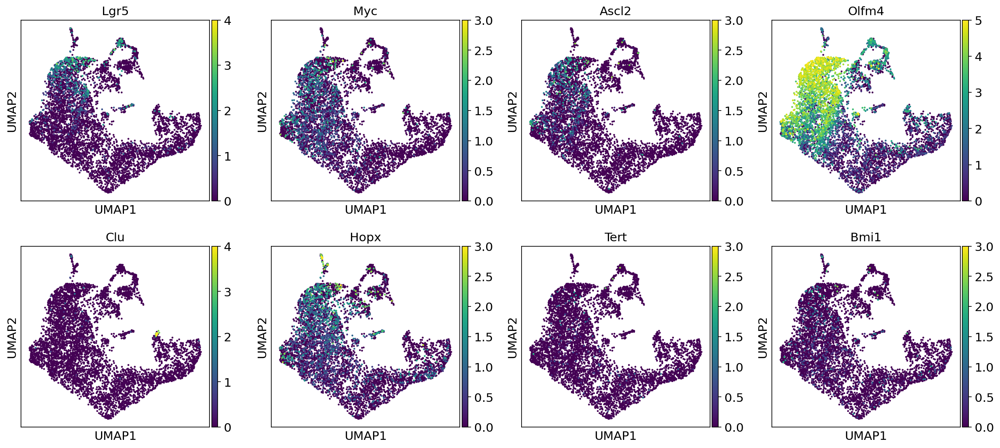

In [20]:
vmax1 = [4,3,3,5,4,3,3,3]
sc.pl.umap( wt, color = list( stem_markers ) , use_raw = False,vmax = vmax1) # vmin = -1, vmax = 5 )

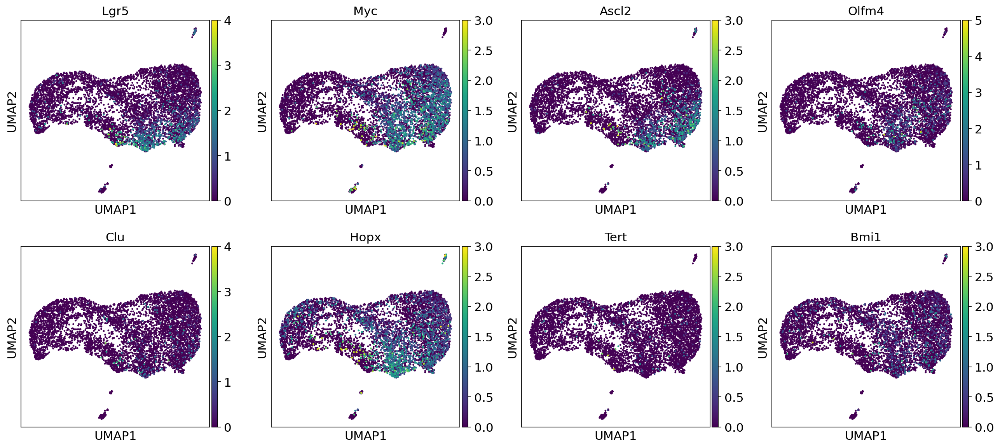

In [21]:
sc.pl.umap( mut, color = list( stem_markers ) , use_raw = False, vmax = vmax1 ) # vmin = -1, vmax = 5 )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


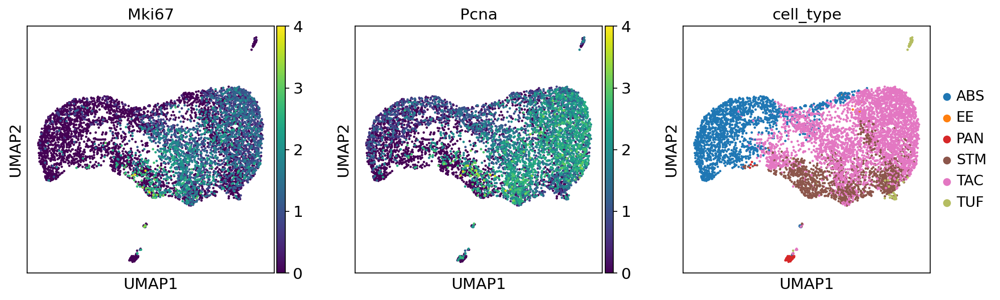

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


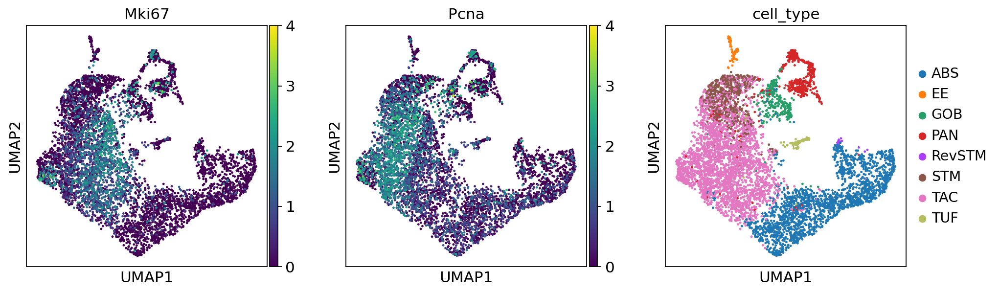

In [22]:
sc.pl.umap( mut, color = ['Mki67','Pcna'] + ['cell_type'] , use_raw = False , vmax = 4)# vmin = 0, vmax = 4)
sc.pl.umap( wt, color = ['Mki67','Pcna'] + ['cell_type'] , use_raw = False, vmax = 4) #vmin = 0, vmax = 4 )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


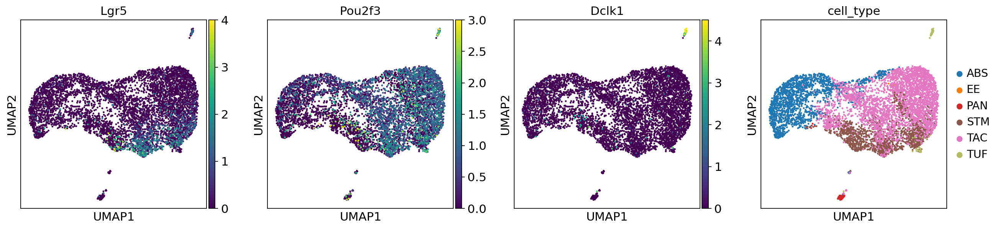

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


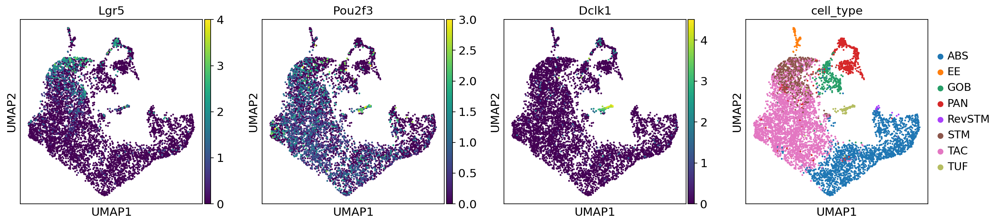

In [24]:
sc.pl.umap( mut, color = ['Lgr5','Pou2f3', 'Dclk1'] + ['cell_type'] , use_raw = False, vmax = [4,3,4.5])# vmax = [8,5,10] )
sc.pl.umap( wt, color = ['Lgr5','Pou2f3', 'Dclk1'] + ['cell_type'] , use_raw = False,vmax = [4,3,4.5])# vmax = [8,5,10] )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


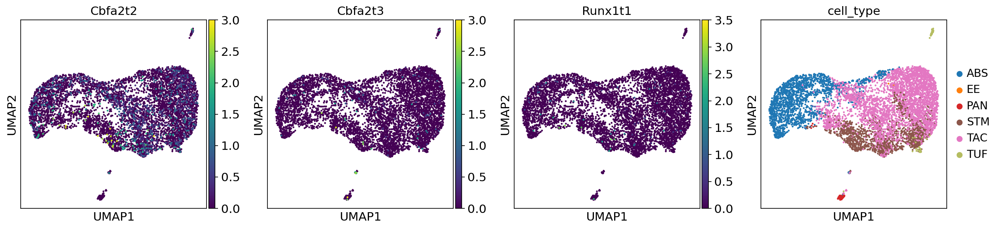

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


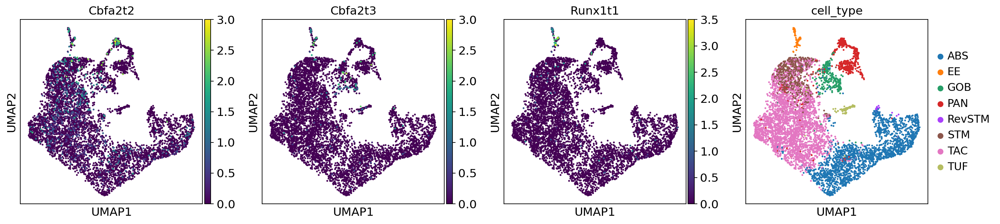

In [26]:
vmax2 = [3,3,3.5]
sc.pl.umap( mut, color = ['Cbfa2t2','Cbfa2t3', 'Runx1t1'] + ['cell_type'] , use_raw = False , vmax = vmax2)# vmax = [8,15,15] , s= 25)
sc.pl.umap( wt, color = ['Cbfa2t2','Cbfa2t3', 'Runx1t1'] + ['cell_type'] , use_raw = False , vmax = vmax2) # vmax = [8,15,15],   s =25)

## barplots

In [59]:
wt.layers['full_norm'] = wt.X.copy()
mut.layers['full_norm'] = mut.X.copy()

In [29]:
dat.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [30]:
dat.raw = dat.copy()

In [31]:
ret = zc.normalization( dat)

In [32]:
dat.X = dat.layers['arcsinh']

In [33]:
stm = dat[dat.obs['cell_type'] == 'STM' ]
stm

View of AnnData object with n_obs × n_vars = 1765 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [34]:
stm_df = stm.to_df()

In [35]:
stm_plot_df = stm_df[ stem_markers]

In [36]:
stm_plot_df['condition'] = stm.obs['condition']

/tmp/ipykernel_234934/1982163683.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stm_plot_df['condition'] = stm.obs['condition']


In [37]:
stm

View of AnnData object with n_obs × n_vars = 1765 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [74]:
list( stm.uns['treatment_colors'])

['#1f77b4', '#ff7f0e']

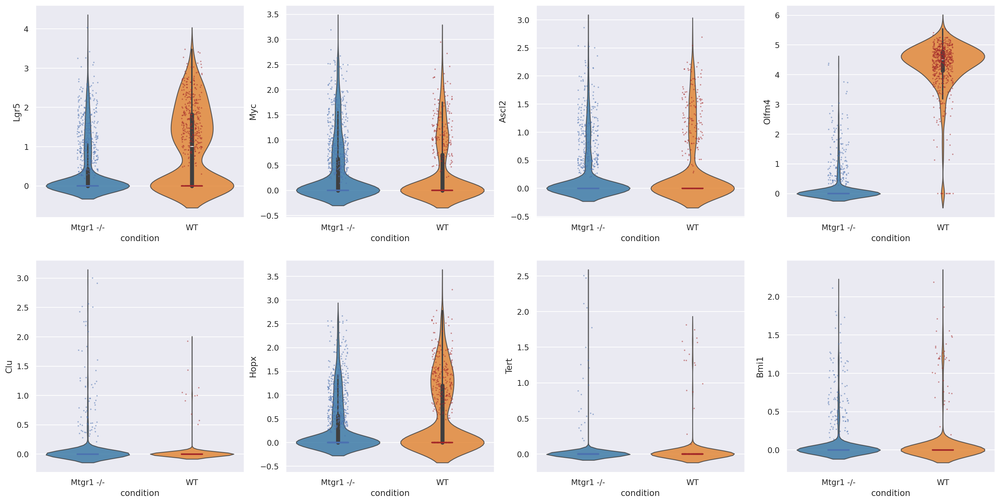

In [75]:
f,axs = plt.subplots( nrows=2, ncols=4, figsize = [24, 12])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( len( stem_markers) ):
    c = stem_markers[i]
    
    sn.violinplot( data = stm_plot_df,  x = 'condition', y = c, 
               palette=list( stm.uns['treatment_colors']), hue = 'condition',
              ax = axs[i], alpha = 0.8)
    sn.stripplot( data = stm_plot_df,  x = 'condition', y = c, 
              palette = ['b', 'brown'], hue = 'condition',
              ax = axs[i], size = 2, alpha = 0.5)
    axs[i].set( ylabel= c)


In [38]:
scaled_df = pd.DataFrame()

In [39]:
for i in range(len( stem_markers)):
    scaled_df = zc.scale_column( stm_plot_df, col_name= stem_markers[i], scaled_col_name= 'scaled_'+ stem_markers[i])

/home/lucy/zc_function.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[scaled_col_name] = (df[col_name] - min_value) / (max_value - min_value)
/home/lucy/zc_function.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[scaled_col_name] = (df[col_name] - min_value) / (max_value - min_value)
/home/lucy/zc_function.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

In [41]:
scaled_df.columns

Index(['Lgr5', 'Myc', 'Ascl2', 'Olfm4', 'Clu', 'Hopx', 'Tert', 'Bmi1',
       'condition', 'scaled_Lgr5', 'scaled_Myc', 'scaled_Ascl2',
       'scaled_Olfm4', 'scaled_Clu', 'scaled_Hopx', 'scaled_Tert',
       'scaled_Bmi1'],
      dtype='object', name='Genes')

In [42]:
scaled_df = scaled_df[ [ 'scaled_Lgr5', 'scaled_Myc', 'scaled_Ascl2',
       'scaled_Olfm4', 'scaled_Clu', 'scaled_Hopx', 'scaled_Tert',
       'scaled_Bmi1'] ]

In [43]:
scaled_df.columns = stem_markers

In [44]:
scaled_df['condition'] = stm_plot_df['condition']

/tmp/ipykernel_234934/326681394.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scaled_df['condition'] = stm_plot_df['condition']


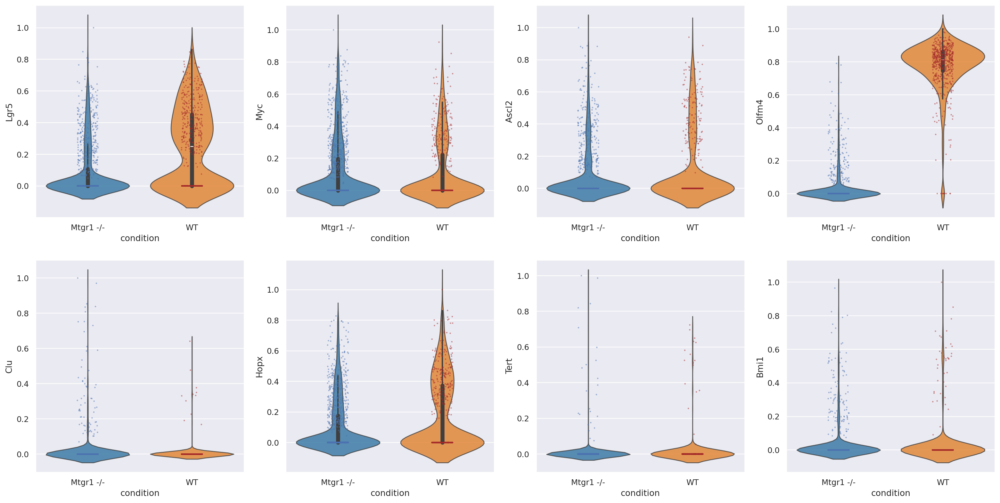

In [86]:
f,axs = plt.subplots( nrows=2, ncols=4, figsize = [24, 12])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( len( stem_markers) ):
    c = stem_markers[i]
    
    sn.violinplot( data = scaled_df,  x = 'condition', y = c, 
               palette=list( stm.uns['treatment_colors']), hue = 'condition',
              ax = axs[i], alpha = 0.8)
    sn.stripplot( data = scaled_df,  x = 'condition', y = c, 
              palette = ['b', 'brown'], hue = 'condition',
              ax = axs[i], size = 2, alpha = 0.5)
    axs[i].set( ylabel= c)


### plot individual violin plots

## revised cell type composition

In [87]:
#subsampled_epi = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")
subsampled_epi = dat

In [88]:
#dat_epi = dat_subsample[dat_subsample.obs['cell_type'] != 'RevSTM' ] 
dat_epi = subsampled_epi[subsampled_epi.obs['cell_type'] != 'RevSTM' ] 

In [89]:
cell_count_df = dat_epi.obs[['cell_type',  'condition']]

In [90]:
group_count_df = cell_count_df.groupby( ['condition','cell_type']).value_counts()

In [91]:
type( group_count_df ) #series
group_count_df = pd.DataFrame( group_count_df)

In [92]:
group_count_df.index[0]

('Mtgr1 -/-', 'ABS')

In [93]:
condition_counts = dat_epi.obs['condition'].value_counts()
condition_counts

condition
Mtgr1 -/-    6427
WT           6345
Name: count, dtype: int64

In [94]:
condition_counts['WT']

6345

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


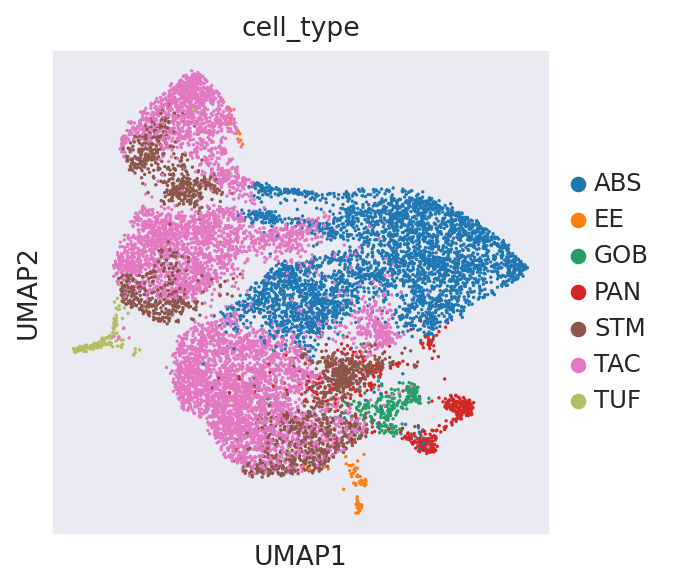

In [95]:
sc.pl.umap( dat_epi, color = 'cell_type' )

In [96]:
group_count_df

count
condition cell_type       
Mtgr1 -/- ABS         1738
          EE            10
          GOB            0
          PAN           67
          STM         1182
          TAC         3356
          TUF           74
WT        ABS         1991
          EE            80
          GOB          266
          PAN          510
          STM          583
          TAC         2835
          TUF           80

In [97]:
pct_count = []
for i in group_count_df.index:
    if ( i[0] == 'WT'):
        pct_count.append( group_count_df.loc[i, 'count']/condition_counts['WT'] )
    else:
        pct_count.append( group_count_df.loc[i, 'count']/condition_counts['Mtgr1 -/-'] )

In [98]:
group_count_df['pct_count'] = pct_count

In [99]:
group_count_df

count  pct_count
condition cell_type                  
Mtgr1 -/- ABS         1738   0.270422
          EE            10   0.001556
          GOB            0   0.000000
          PAN           67   0.010425
          STM         1182   0.183912
          TAC         3356   0.522172
          TUF           74   0.011514
WT        ABS         1991   0.313790
          EE            80   0.012608
          GOB          266   0.041923
          PAN          510   0.080378
          STM          583   0.091883
          TAC         2835   0.446809
          TUF           80   0.012608

In [100]:
group_count_df['condition'] = [ i[0] for i in group_count_df.index ]
group_count_df['cell_type'] = [ i[1] for i in group_count_df.index ]

In [101]:
group_count_df.reset_index(drop = True)

,count,pct_count,condition,cell_type
0,1738,0.270422,Mtgr1 -/-,ABS
1,10,0.001556,Mtgr1 -/-,EE
2,0,0.000000,Mtgr1 -/-,GOB
3,67,0.010425,Mtgr1 -/-,PAN
4,1182,0.183912,Mtgr1 -/-,STM
5,3356,0.522172,Mtgr1 -/-,TAC
6,74,0.011514,Mtgr1 -/-,TUF
7,1991,0.313790,WT,ABS
8,80,0.012608,WT,EE
9,266,0.041923,WT,GOB


In [102]:
x = np.arange(0, 10, step=1.5)
x[0:7]

array([0. , 1.5, 3. , 4.5, 6. , 7.5, 9. ])

In [103]:
dat_epi

View of AnnData object with n_obs × n_vars = 12772 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [104]:
dat_epi.uns['treatment_colors']

array(['#1f77b4', '#ff7f0e'], dtype=object)

/tmp/ipykernel_200216/2066695869.py:2: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sn.barplot( data = group_count_df, x = 'cell_type', y = 'pct_count', hue = 'condition',


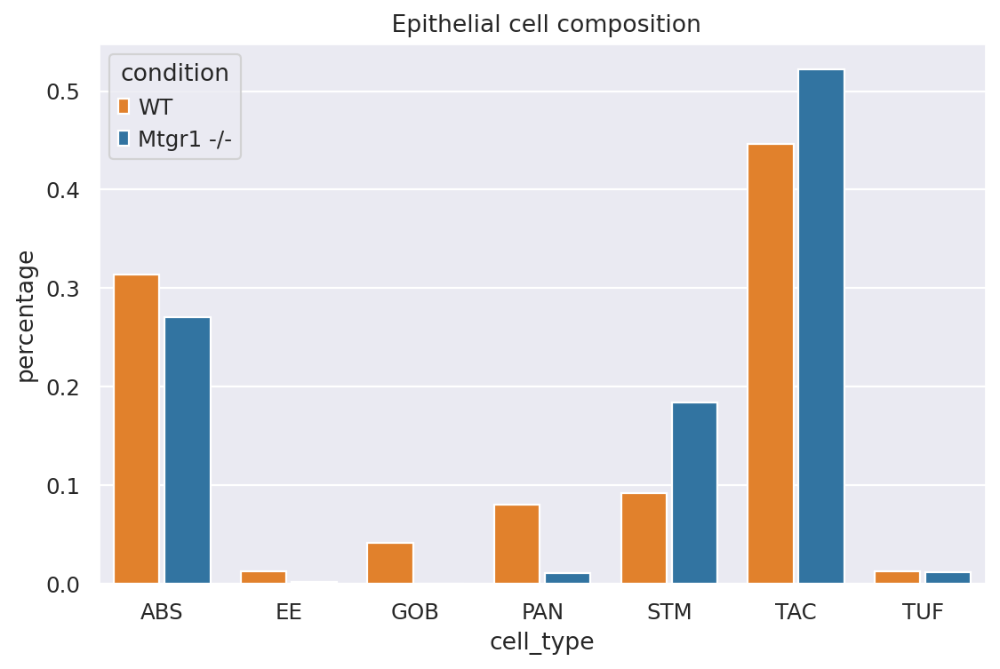

In [105]:
f,ax = plt.subplots(figsize = [8,5])
sn.barplot( data = group_count_df, x = 'cell_type', y = 'pct_count', hue = 'condition',
           hue_order=['WT', 'Mtgr1 -/-'], palette=dat_epi.uns['treatment_colors'][::-1], 
            dodge=True, width=0.8, ax = ax, gap = 0.1 )
t= ax.set_ylabel( "percentage")
t = ax.set_title(" Epithelial cell composition")
loc, lab = plt.xticks()
#plt.xticks(np.arange(0, 1, step=0.2)) 
#plt.xticks(ticks = x[0:7] )


### make new version of the barplot

In [106]:
cell_count_df = dat_epi.obs[['cell_type',   'sample']]

In [107]:
group_count_df = cell_count_df.groupby( ['sample','cell_type']).value_counts()

In [108]:
group_count_df

sample   cell_type
10868_1  ABS           525
         EE             19
         GOB            90
         PAN           140
         STM           237
         TAC           612
         TUF             9
10868_2  ABS           640
         EE             24
         GOB            98
         PAN           111
         STM           194
         TAC          1079
         TUF            25
10868_3  ABS           826
         EE             37
         GOB            78
         PAN           259
         STM           152
         TAC          1144
         TUF            46
10868_5  ABS          1468
         EE              0
         GOB             0
         PAN            67
         STM           668
         TAC          2135
         TUF            64
11283_1  ABS           270
         EE             10
         GOB             0
         PAN             0
         STM           514
         TAC          1221
         TUF            10
Name: count, dtype: int64

In [109]:
type( group_count_df)

pandas.core.series.Series

In [110]:
group_count_df = pd.DataFrame( group_count_df )

In [111]:
group_count_df2 = group_count_df.reset_index()

In [112]:
group_count_df2.head()

,sample,cell_type,count
0,10868_1,ABS,525
1,10868_1,EE,19
2,10868_1,GOB,90
3,10868_1,PAN,140
4,10868_1,STM,237


get percentage of each cell type in each sample

In [113]:
sample_count = subsampled_epi.obs['sample'].value_counts()

In [114]:
sample_count

sample
10868_5    4402
10868_3    2562
10868_2    2171
11283_1    2025
10868_1    1632
Name: count, dtype: int64

In [115]:
sample_count['10868_5']

4402

In [116]:
pct_count = []
for i in group_count_df2.index:
    s = group_count_df2.loc[i, 'sample']
    s_count = sample_count[s]
    pct_count.append( group_count_df2.loc[i, 'count']/s_count )

In [117]:
group_count_df2['pct'] = pct_count

In [118]:
group_count_df2.head(3)

,sample,cell_type,count,pct
0,10868_1,ABS,525,0.321691
1,10868_1,EE,19,0.011642
2,10868_1,GOB,90,0.055147


In [119]:
condition = []
for i in group_count_df2.index:
    if( group_count_df2.loc[i, 'sample'] == '10868_5' or group_count_df2.loc[i, 'sample'] == '11283_1' ):
        condition.append( 'Mtgr1 -/-')
    else:
        condition.append( 'WT' )

In [120]:
group_count_df2['condition' ] = condition

<Axes: xlabel='cell_type', ylabel='pct'>

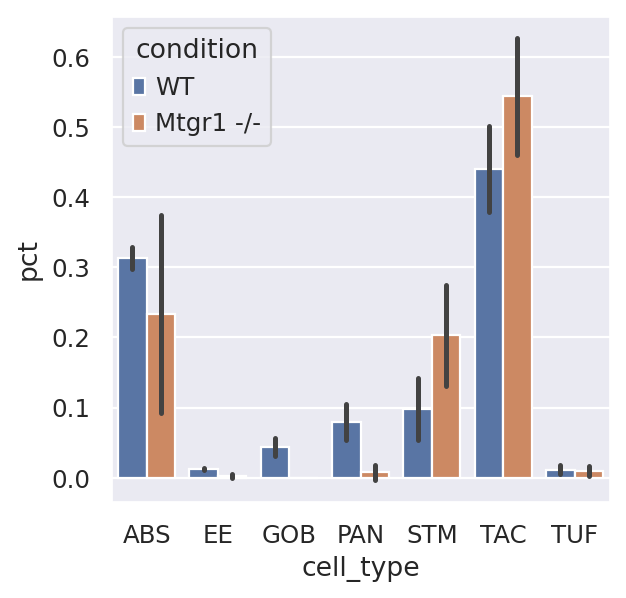

In [121]:
f,ax = plt.subplots()
sn.barplot( data = group_count_df2, x =  'cell_type', y='pct', hue = 'condition', errorbar='sd' )

In [122]:
subsampled_epi

AnnData object with n_obs × n_vars = 12792 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'cell_type_old_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [124]:
sc.set_figure_params(figsize=[4,4])

/tmp/ipykernel_200216/1706538059.py:2: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sn.barplot( data = group_count_df2, x = 'cell_type', y = 'pct', hue = 'condition',


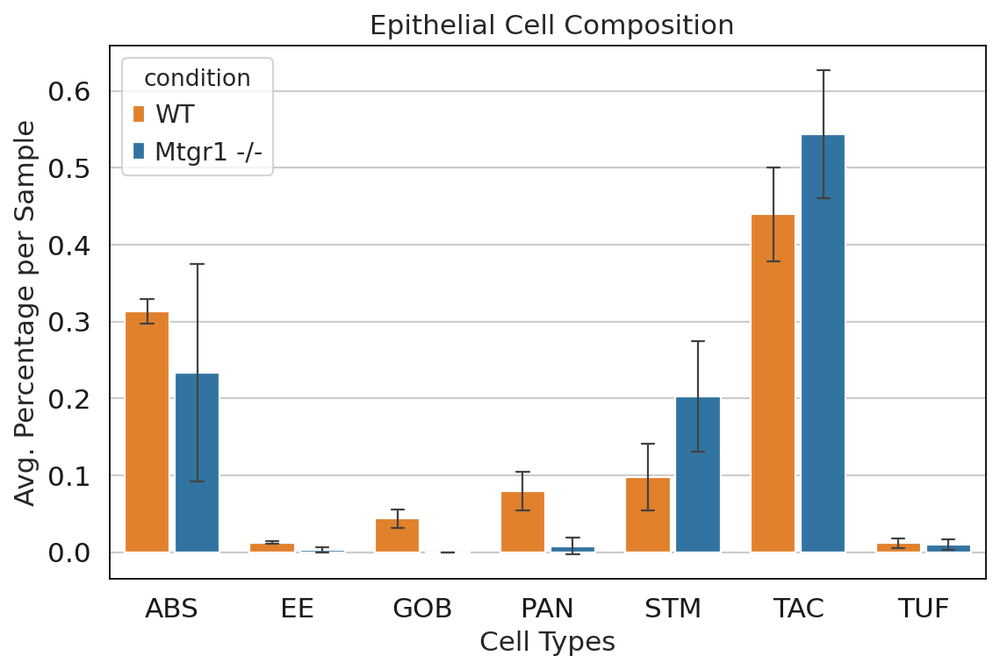

In [125]:
f,ax = plt.subplots(figsize = [8,5])
sn.barplot( data = group_count_df2, x = 'cell_type', y = 'pct', hue = 'condition',
            errorbar='sd',
           err_kws = {'linewidth':1, }, capsize = 0.2, 
           hue_order=['WT', 'Mtgr1 -/-'], palette=subsampled_epi.uns['treatment_colors'][::-1],
           ax = ax, gap = 0.1, )
t= ax.set_ylabel( "Avg. Percentage per Sample")
t= ax.set_xlabel( "Cell Types")
t = ax.set_title(" Epithelial Cell Composition")
loc, lab = plt.xticks()

### composition plots with revival stem cell and stat annotation

In [53]:
dat.obs['cell_type'].unique()

['TAC', 'ABS', 'PAN', 'STM', 'GOB', 'EE', 'TUF', 'RevSTM']
Categories (8, object): ['ABS', 'EE', 'GOB', 'PAN', 'RevSTM', 'STM', 'TAC', 'TUF']

In [54]:
dat_epi = dat.copy()

In [55]:
cell_count_df = dat_epi.obs[['cell_type',   'sample']]

In [56]:
group_count_df = cell_count_df.groupby( ['sample','cell_type']).value_counts()

In [57]:
group_count_df

sample   cell_type
10868_1  ABS           525
         EE             19
         GOB            90
         PAN           140
         RevSTM          0
         STM           237
         TAC           612
         TUF             9
10868_2  ABS           640
         EE             24
         GOB            98
         PAN           111
         RevSTM          0
         STM           194
         TAC          1079
         TUF            25
10868_3  ABS           826
         EE             37
         GOB            78
         PAN           259
         RevSTM         20
         STM           152
         TAC          1144
         TUF            46
10868_5  ABS          1468
         EE              0
         GOB             0
         PAN            67
         RevSTM          0
         STM           668
         TAC          2135
         TUF            64
11283_1  ABS           270
         EE             10
         GOB             0
         PAN             0
         

In [109]:
type( group_count_df)

pandas.core.series.Series

In [58]:
group_count_df = pd.DataFrame( group_count_df )

In [59]:
group_count_df2 = group_count_df.reset_index()

In [60]:
group_count_df2.head()

,sample,cell_type,count
0,10868_1,ABS,525
1,10868_1,EE,19
2,10868_1,GOB,90
3,10868_1,PAN,140
4,10868_1,RevSTM,0


get percentage of each cell type in each sample

In [63]:
sample_count = dat_epi.obs['sample'].value_counts()

In [64]:
sample_count

sample
10868_5    4402
10868_3    2562
10868_2    2171
11283_1    2025
10868_1    1632
Name: count, dtype: int64

In [65]:
sample_count['10868_5']

4402

In [66]:
pct_count = []
for i in group_count_df2.index:
    s = group_count_df2.loc[i, 'sample']
    s_count = sample_count[s]
    pct_count.append( group_count_df2.loc[i, 'count']/s_count )

In [67]:
group_count_df2['pct'] = pct_count

In [68]:
group_count_df2.head(3)

,sample,cell_type,count,pct
0,10868_1,ABS,525,0.321691
1,10868_1,EE,19,0.011642
2,10868_1,GOB,90,0.055147


In [69]:
condition = []
for i in group_count_df2.index:
    if( group_count_df2.loc[i, 'sample'] == '10868_5' or group_count_df2.loc[i, 'sample'] == '11283_1' ):
        condition.append( 'Mtgr1 -/-')
    else:
        condition.append( 'WT' )

In [70]:
group_count_df2['condition' ] = condition

<Axes: xlabel='cell_type', ylabel='pct'>

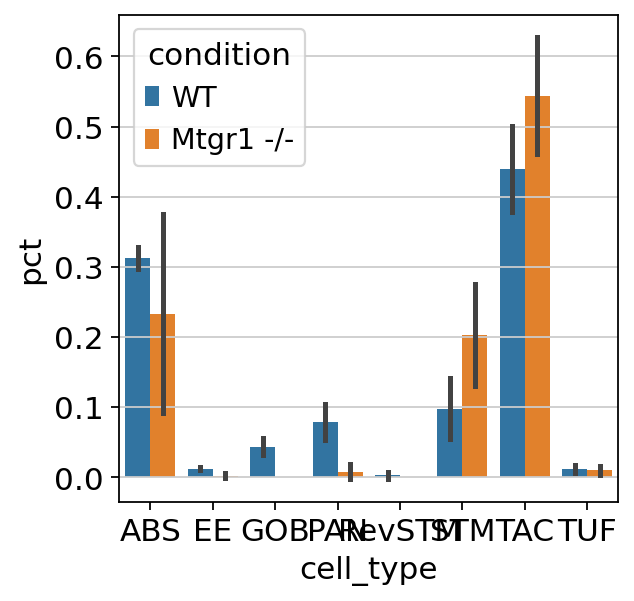

In [71]:
f,ax = plt.subplots()
sn.barplot( data = group_count_df2, x =  'cell_type', y='pct', hue = 'condition', errorbar='sd' )

In [72]:
#subsampled_epi

In [73]:
sc.set_figure_params(figsize=[4,4])

In [80]:
dat_epi.uns['treatment_colors']

array(['#1f77b4', '#ff7f0e'], dtype=object)

/tmp/ipykernel_234934/983144740.py:2: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sn.barplot( data = group_count_df2, x = 'cell_type', y = 'pct', hue = 'condition',


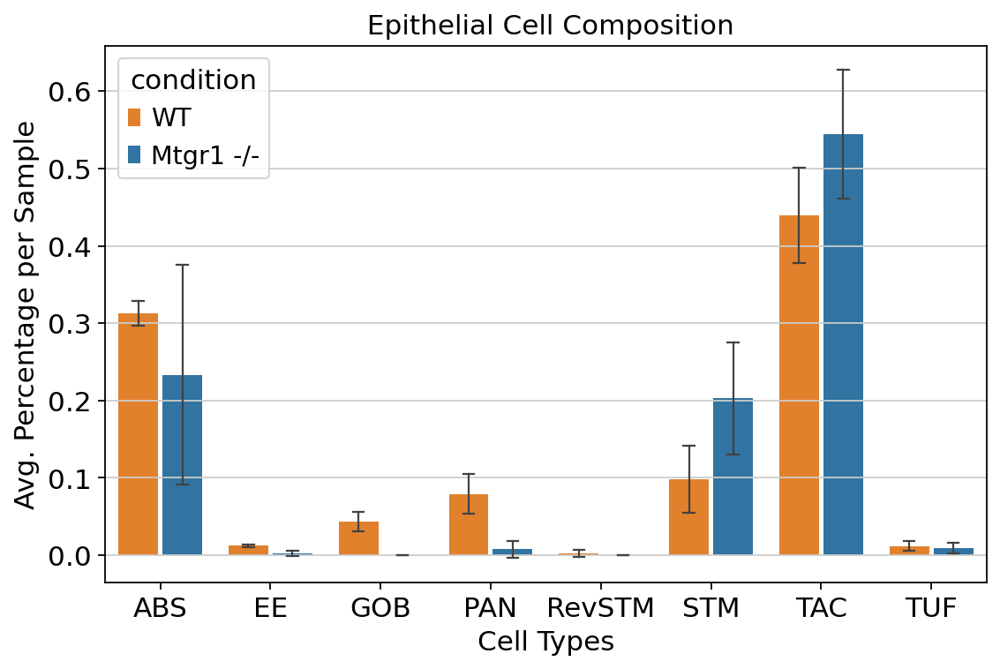

In [75]:
f,ax = plt.subplots(figsize = [8,5])
sn.barplot( data = group_count_df2, x = 'cell_type', y = 'pct', hue = 'condition',
            errorbar='sd',
           err_kws = {'linewidth':1, }, capsize = 0.2, 
           hue_order=['WT', 'Mtgr1 -/-'], palette=dat_epi.uns['treatment_colors'][::-1],
           ax = ax, gap = 0.1, )
t= ax.set_ylabel( "Avg. Percentage per Sample")
t= ax.set_xlabel( "Cell Types")
t = ax.set_title(" Epithelial Cell Composition")
loc, lab = plt.xticks()

## save data

In [15]:
wt.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [4740.],
        [3316.],
        [9408.]], dtype=float32)

In [16]:
wt.write("./new_sample_10868_filtered/subsampled_wt_epi.h5ad", compression = 'gzip')

In [17]:
pd.DataFrame( wt.obsm['X_umap'], index = wt.obs.index).to_csv("./batch_effect_correction/wt_hm_umap_crab.csv", header = False, index = True) 

In [45]:
scaled_df.to_csv("./stem_marker_scaled_df.csv", header = True, index = True)

In [79]:
# save the cell type composition percentage df to perform stat annnotation in another kernel
#group_count_df2.head(2)
group_count_df2.to_csv( "./cell_type_composition_pct.csv", header = True, index = True)